# **Hiruni ML coursework VI**

In [ ]:
pip install kmodes


In [ ]:
pip install scikit-learn-extra


In [ ]:
pip install factor-analyzer


In [ ]:
pip install prince


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from scipy.stats import kruskal
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.stats import chi2_contingency
#import important libraries
import pandas as pd
import numpy as np
import sys
import os
#ignore warnings
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import OneHotEncoder, LabelEncoder
from sklearn import model_selection
from sklearn import preprocessing
from scipy.stats import chi2_contingency

from imblearn.over_sampling import SMOTE
from sklearn.datasets import make_classification

from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV
from statsmodels.stats.outliers_influence import variance_inflation_factor
from tabulate import tabulate
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.neural_network import MLPClassifier

from kmodes.kprototypes import KPrototypes
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
from sklearn_extra.cluster import KMedoids
from factor_analyzer import FactorAnalyzer

from prince import FAMD

import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
import gdown
import pandas as pd

# Updated file ID for the new dataset from your link
file_id = '1Y2qtw19Ld_9QIBw90HE_d-2r3zvu7O1J'
url = f'https://drive.google.com/uc?id={file_id}'

# Download the file
output_file = 'new_cleaned.csv'
gdown.download(url, output=output_file, quiet=False)

# Read the downloaded CSV file into a pandas DataFrame
data = pd.read_csv(output_file)

# Display the first few rows of the dataframe
print(data.head())

# Create a copy of the dataframe
df = data.copy()


Downloading...
From: https://drive.google.com/uc?id=1Y2qtw19Ld_9QIBw90HE_d-2r3zvu7O1J
To: /content/new_cleaned.csv
100%|██████████| 2.17M/2.17M [00:00<00:00, 38.9MB/s]


   Survey ID  Achieving Ends Meet     Ethnicity  Household Size  \
0    1011601                    0       Chinese               3   
1      10786                    0  Asian Indian               3   
2      10809                    1  Asian Indian               2   
3      10856                    0  Asian Indian               1   
4      10103                    0  Asian Indian               3   

              Income  Age  Education Completed      Belonging  \
0        $0 - $9,999   23                   16  Not very much   
1   $70,000 and over   34                   17      Very much   
2   $70,000 and over   28                   17  Not very much   
3  $50,000 - $59,999   25                   17  Not very much   
4   $70,000 and over   60                   17  Not very much   

   Discrimination  English Difficulties  ... Home Phone             Informed  \
0                0                 Much  ...         No       Not interested   
1                0           Not at all  ...  

## Back-up


In [ ]:
# Create a copy of the dataframe
df = data.copy()

In [ ]:
df.head()

,Survey ID,Achieving Ends Meet,Ethnicity,Household Size,Income,Age,Education Completed,Belonging,Discrimination,English Difficulties,...,Home Phone,Informed,City Effort Satisfaction,3-1-1_9-1-1,City-based,Non-city-based Ethnic,Non-city-based General,Mode of Transport,Awareness of Services,Civic Engagement
0,1011601,0,Chinese,3,"$0 - $9,999",23,16,Not very much,0,Much,...,No,Not interested,Somewhat dissatisfied,1,1,2,1,Public Transportation,Aware,Not Engaged
1,10786,0,Asian Indian,3,"$70,000 and over",34,17,Very much,0,Not at all,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,1,0,0,Car,Aware,Not Engaged
2,10809,1,Asian Indian,2,"$70,000 and over",28,17,Not very much,0,Much,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,0,0,0,Car,Aware,Not Engaged
3,10856,0,Asian Indian,1,"$50,000 - $59,999",25,17,Not very much,0,Not at all,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,1,0,0,Car,Aware,Not Engaged
4,10103,0,Asian Indian,3,"$70,000 and over",60,17,Not very much,0,Not at all,...,Yes,Interested,Niether satisfied or dissatisfied,1,1,1,1,Car,Aware,Not Engaged


In [ ]:
df.shape

(2565, 122)

In [ ]:
df.columns

Index(['Survey ID', 'Achieving Ends Meet', 'Ethnicity', 'Household Size',
       'Income', 'Age', 'Education Completed', 'Belonging', 'Discrimination ',
       'English Difficulties',
       ...
       'Home Phone', 'Informed', 'City Effort Satisfaction', '3-1-1_9-1-1',
       'City-based', 'Non-city-based Ethnic', 'Non-city-based General',
       'Mode of Transport', 'Awareness of Services', 'Civic Engagement'],
      dtype='object', length=122)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2565 entries, 0 to 2564
Columns: 122 entries, Survey ID to Civic Engagement
dtypes: float64(10), int64(13), object(99)
memory usage: 2.4+ MB


In [ ]:
print(df.columns.tolist())

['Survey ID', 'Achieving Ends Meet', 'Ethnicity', 'Household Size', 'Income', 'Age', 'Education Completed', 'Belonging', 'Discrimination ', 'English Difficulties', 'English Speaking', 'Familiarity with America', 'Familiarity with Ethnic Origin', 'Identify Ethnically', 'Primary Language', 'US Born', 'Duration of Residency', 'Present Health', 'Present Mental Health', 'Present Oral Health', 'Hygiene Assistance', 'Drinking', 'Regular Exercise', 'Healthy Diet', 'Hypertension', 'Diabetes', 'Arthritis', 'Physical Check-up', 'Dentist Check-up', 'Folkmedicine', 'Primary Care', 'Health Insurance', 'Dental Insurance', 'Unmet Health Need', 'Unmet Dental Needs', 'Transportation (Medical)', 'Interpretation (Medical)', 'Comunication Problem', 'Preferance', 'Language', 'users', 'Satisfaction', 'Close Friend', 'Heal Professionals', 'Online Communities', 'Health Website', 'Other', 'Satisfied With Life 1', 'Satisfied With Life 2', 'General Practitioner', 'Religious Leader', 'Weakness', 'Shame', 'Disappoi

In [ ]:
# Drop "Survey ID" column

In [ ]:
# Assing Survey ID to new frame and drop from initial df
# Assuming 'Survey ID' is the column name in the DataFrame
survey_id_df = df[['Survey ID']].copy()  # Create a new DataFrame with only 'Survey ID'
df = df.drop(columns=['Survey ID'])      # Drop 'Survey ID' from the original DataFrame

# Display the first few rows of the new DataFrames
print(survey_id_df.head())
print(df.head())




   Survey ID
0    1011601
1      10786
2      10809
3      10856
4      10103
   Achieving Ends Meet     Ethnicity  Household Size             Income  Age  \
0                    0       Chinese               3        $0 - $9,999   23   
1                    0  Asian Indian               3   $70,000 and over   34   
2                    1  Asian Indian               2   $70,000 and over   28   
3                    0  Asian Indian               1  $50,000 - $59,999   25   
4                    0  Asian Indian               3   $70,000 and over   60   

   Education Completed      Belonging  Discrimination  English Difficulties  \
0                   16  Not very much                0                 Much   
1                   17      Very much                0           Not at all   
2                   17  Not very much                0                 Much   
3                   17  Not very much                0           Not at all   
4                   17  Not very much         

In [ ]:
df.head(2)

,Achieving Ends Meet,Ethnicity,Household Size,Income,Age,Education Completed,Belonging,Discrimination,English Difficulties,English Speaking,...,Home Phone,Informed,City Effort Satisfaction,3-1-1_9-1-1,City-based,Non-city-based Ethnic,Non-city-based General,Mode of Transport,Awareness of Services,Civic Engagement
0,0,Chinese,3,"$0 - $9,999",23,16,Not very much,0,Much,Well,...,No,Not interested,Somewhat dissatisfied,1,1,2,1,Public Transportation,Aware,Not Engaged
1,0,Asian Indian,3,"$70,000 and over",34,17,Very much,0,Not at all,Very well,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,1,0,0,Car,Aware,Not Engaged


# Data Types

In [ ]:
###################################################################################################################

In [ ]:
#Data Types
# Display data types of each column in the DataFrame
print(df.dtypes)



Achieving Ends Meet        int64
Ethnicity                 object
Household Size             int64
Income                    object
Age                        int64
                           ...  
Non-city-based Ethnic      int64
Non-city-based General     int64
Mode of Transport         object
Awareness of Services     object
Civic Engagement          object
Length: 121, dtype: object


In [ ]:
# Loop through each column in the DataFrame
for column in df.columns:
    print(f"Column: {column}")
    print(df[column].value_counts())  # Print unique values and their counts
    print("\n")  # Add a newline for better readability


Column: Achieving Ends Meet
Achieving Ends Meet
0    2152
1     413
Name: count, dtype: int64


Column: Ethnicity
Ethnicity
Chinese         630
Asian Indian    568
Vietnamese      495
Korean          467
Filipino        262
Other           143
Name: count, dtype: int64


Column: Household Size
Household Size
2    709
4    653
3    547
5    249
1    206
6    133
7     40
8     28
Name: count, dtype: int64


Column: Income
Income
$70,000 and over     1175
$0 - $9,999           246
$10,000 - $19,999     203
$30,000 - $39,999     202
$20,000 - $29,999     195
$60,000 - $69,999     190
$50,000 - $59,999     177
$40,000 - $49,999     177
Name: count, dtype: int64


Column: Age
Age
25    83
32    77
40    74
30    69
34    66
      ..
81     3
88     3
86     1
87     1
98     1
Name: count, Length: 73, dtype: int64


Column: Education Completed
Education Completed
17    913
16    780
12    329
14    175
13    121
15    114
10     27
9      25
6      22
11     21
8      14
7      12
5       6

In [ ]:
# List of columns to convert to categorical (nominal)
columns_to_convert_1 = [
    'Achieving Ends Meet', 'Ethnicity', 'Belonging', 'Discrimination ', 'Primary Language',
    'US Born', 'Hygiene Assistance', 'Drinking', 'Regular Exercise', 'Healthy Diet',
    'Hypertension', 'Diabetes', 'Arthritis', 'Physical Check-up', 'Dentist Check-up',
    'Folkmedicine', 'Primary Care', 'Health Insurance', 'Dental Insurance',
    'Unmet Health Need', 'Unmet Dental Needs', 'Transportation (Medical)',
    'Interpretation (Medical)', 'Preference', 'Language', 'users', 'Close Friend',
    'Heal Professionals', 'Online Communities', 'Health Website', 'Other',
    'General Practitioner', 'Religious Leader', 'Weakness', 'Shame', 'Disappointment',
    'Disclosure', 'Recovery', 'Danger', 'Treatment', 'Comunication Problem', 'Education (AD)',
    'Services (AD)', 'Language Barrier (AD)', 'Aging (AD)', 'Avoidance (AD)',
    'Advanced Directives', 'Have an Advanced Directive', 'Superstition',
    'Concern for Self & Others (AD)', 'Planning and Preparedness',
    'Fate (AD) and Embarrassing (AD)', 'Nursing Home', 'Smoke Detector',
    'Recycle', 'Compost', 'Access to a Computer', 'Mobile Devices', 'Home Phone',
    'Mode of Transport', 'Awareness of Services', 'Civic Engagement'
]
Nominal_Catergorical=columns_to_convert_1
columns_to_convert=columns_to_convert_1

# Convert existing columns to categorical and check which ones exist
for column in columns_to_convert:
    if column in df.columns:
        df[column] = df[column].astype('category')
        print(f"Converted to categorical: {column}")
    else:
        print(f"Column not found: {column}")


Converted to categorical: Achieving Ends Meet
Converted to categorical: Ethnicity
Converted to categorical: Belonging
Converted to categorical: Discrimination 
Converted to categorical: Primary Language
Converted to categorical: US Born
Converted to categorical: Hygiene Assistance
Converted to categorical: Drinking
Converted to categorical: Regular Exercise
Converted to categorical: Healthy Diet
Converted to categorical: Hypertension
Converted to categorical: Diabetes
Converted to categorical: Arthritis
Converted to categorical: Physical Check-up
Converted to categorical: Dentist Check-up
Converted to categorical: Folkmedicine
Converted to categorical: Primary Care
Converted to categorical: Health Insurance
Converted to categorical: Dental Insurance
Converted to categorical: Unmet Health Need
Converted to categorical: Unmet Dental Needs
Converted to categorical: Transportation (Medical)
Converted to categorical: Interpretation (Medical)
Converted to categorical: Preference
Converted to

In [ ]:
# Assuming `Nominal_Categorical` is a set containing your categorical variable names
# and `data` is your DataFrame




# Assuming `Nominal_Categorical` is a list and `data` is your DataFrame

Nominal_Categorical_in_both = set(Nominal_Catergorical).intersection(set(data.columns))

# Convert to a list if needed
Nominal_Categorical_in_both = list(Nominal_Categorical_in_both)

print(Nominal_Categorical_in_both)


['Have an Advanced Directive', 'Interpretation (Medical)', 'Unmet Health Need', 'Advanced Directives', 'Health Website', 'Recovery', 'Fate (AD) and Embarrassing (AD)', 'Concern for Self & Others (AD)', 'Physical Check-up', 'US Born', 'Hygiene Assistance', 'Discrimination ', 'Services (AD)', 'Online Communities', 'Hypertension', 'Heal Professionals', 'Recycle', 'Belonging', 'Awareness of Services', 'Nursing Home', 'Superstition', 'Weakness', 'Folkmedicine', 'Dental Insurance', 'Dentist Check-up', 'users', 'Civic Engagement', 'Mobile Devices', 'Ethnicity', 'Access to a Computer', 'Regular Exercise', 'Other', 'General Practitioner', 'Diabetes', 'Unmet Dental Needs', 'Language', 'Shame', 'Transportation (Medical)', 'Planning and Preparedness', 'Education (AD)', 'Primary Care', 'Close Friend', 'Mode of Transport', 'Comunication Problem', 'Achieving Ends Meet', 'Aging (AD)', 'Disclosure', 'Danger', 'Disappointment', 'Drinking', 'Healthy Diet', 'Arthritis', 'Avoidance (AD)', 'Health Insurance

In [ ]:
import pandas as pd

# List of columns to convert to categorical
categorical_columns_2 = [
    'Income','English Difficulties', 'English Speaking', 'Familiarity with America',
    'Familiarity with Ethnic Origin', 'Identify Ethnically', 'Present Health',
    'Present Mental Health', 'Present Oral Health', 'Satisfaction',
    'Satisfied With Life 1', 'Satisfied With Life 2', 'Knowledge',
    'Quality of Life', 'Place to Live', 'Raising Children', 'Place to Work',
    'Small Businesses ', 'Place to Retire', 'Arts and Culture', 'Safety',
    'Traffic', 'Qualtiy of Life in Austin', 'Quality of Service', 'Parks and Recs',
    'Libraries', 'Public Safety', 'Airport', 'Austin Energy', 'Court',
    'Social Services', 'Aware of AARC', 'Visit Frequency ', 'Activities',
    'District', 'Housing ', 'Status of Ownership', 'Satisfaction With Housing.',
    'Informed', 'City Effort Satisfaction', '3-1-1_9-1-1', 'Non-city-based Ethnic',
    'City-based', 'Non-city-based General'
]
Ordinal_Caatergorical=categorical_columns_2
categorical_columns = categorical_columns_2
# Convert existing columns to categorical and check which ones exist
for column in categorical_columns:
    if column in df.columns:
        df[column] = df[column].astype('category')
        print(f"Converted to categorical: {column}")
    else:
        print(f"Column not found: {column}")


Converted to categorical: Income
Converted to categorical: English Difficulties
Converted to categorical: English Speaking
Converted to categorical: Familiarity with America
Converted to categorical: Familiarity with Ethnic Origin
Converted to categorical: Identify Ethnically
Converted to categorical: Present Health
Converted to categorical: Present Mental Health
Converted to categorical: Present Oral Health
Converted to categorical: Satisfaction
Converted to categorical: Satisfied With Life 1
Converted to categorical: Satisfied With Life 2
Converted to categorical: Knowledge
Converted to categorical: Quality of Life
Converted to categorical: Place to Live
Converted to categorical: Raising Children
Converted to categorical: Place to Work
Converted to categorical: Small Businesses 
Converted to categorical: Place to Retire
Converted to categorical: Arts and Culture
Converted to categorical: Safety
Converted to categorical: Traffic
Converted to categorical: Qualtiy of Life in Austin
Conv

In [ ]:
# Assuming `Ordinal_Categorical` is a list and `data` is your DataFrame

Ordinal_Categorical_in_both = set(Ordinal_Caatergorical).intersection(set(data.columns))

# Convert to a list if needed
Ordinal_Categorical_in_both = list(Ordinal_Categorical_in_both)

print(Ordinal_Categorical_in_both)


['Activities', 'Familiarity with Ethnic Origin', 'Present Health', 'Knowledge', 'Libraries', 'Non-city-based General', 'Identify Ethnically', 'Quality of Life', 'City-based', 'Raising Children', 'Housing ', 'Place to Work', 'Traffic', 'Non-city-based Ethnic', 'Quality of Service', 'English Difficulties', 'Parks and Recs', 'Satisfaction', 'Arts and Culture', 'Informed', 'Place to Retire', 'Satisfied With Life 2', 'City Effort Satisfaction', 'Court', 'Visit Frequency ', '3-1-1_9-1-1', 'Safety', 'Austin Energy', 'District', 'Satisfied With Life 1', 'Qualtiy of Life in Austin', 'Airport', 'Familiarity with America', 'Place to Live', 'Present Mental Health', 'Social Services', 'Present Oral Health', 'English Speaking', 'Aware of AARC', 'Small Businesses ', 'Status of Ownership', 'Public Safety', 'Income', 'Satisfaction With Housing.']


In [ ]:
import pandas as pd

# List of numerical columns to convert
numerical_columns = [
     'Age', 'Duration of Residency', 'Family Connectivity Score',
    'Friends Connectivity Score', 'Religious Connectivity Score',
    'Family Relationship Score', 'Family Values Score',
    'Family Expression Score', 'Family Dynamics Score',
    'Community Engagement Score', 'Residency '
]

# Convert existing columns to numerical (float or int) and check which ones exist
for column in numerical_columns:
    if column in df.columns:
        # Attempt to convert to float (or int if suitable)
        df[column] = pd.to_numeric(df[column], errors='coerce')  # Converts to float, coercing errors to NaN
        print(f"Converted to numerical: {column}")
    else:
        print(f"Column not found: {column}")


Converted to numerical: Age
Converted to numerical: Duration of Residency
Converted to numerical: Family Connectivity Score
Converted to numerical: Friends Connectivity Score
Converted to numerical: Religious Connectivity Score
Converted to numerical: Family Relationship Score
Converted to numerical: Family Values Score
Converted to numerical: Family Expression Score
Converted to numerical: Family Dynamics Score
Converted to numerical: Community Engagement Score
Converted to numerical: Residency 


In [ ]:
# Assuming `numerical_columns` is a list and `data` is your DataFrame

Numerical_Columns_in_both = set(numerical_columns).intersection(set(data.columns))

# Convert to a list if needed
Numerical_Columns_in_both = list(Numerical_Columns_in_both)

print(Numerical_Columns_in_both)


['Residency ', 'Friends Connectivity Score', 'Family Connectivity Score', 'Family Relationship Score', 'Age', 'Family Dynamics Score', 'Family Expression Score', 'Family Values Score', 'Religious Connectivity Score', 'Community Engagement Score', 'Duration of Residency']


In [ ]:
import pandas as pd

# List of numerical discrete columns to convert
discrete_columns = [
    'Household Size', 'Education Completed', 'Community Trust Score'
]

# Convert existing columns to numerical (discrete) and check which ones exist
for column in discrete_columns:
    if column in df.columns:
        # Attempt to convert to integer (or float if suitable)
        df[column] = pd.to_numeric(df[column], errors='coerce').astype('Int64')  # Convert to nullable integer type
        print(f"Converted to numerical discrete: {column}")
    else:
        print(f"Column not found: {column}")


Converted to numerical discrete: Household Size
Converted to numerical discrete: Education Completed
Converted to numerical discrete: Community Trust Score


In [ ]:
# Assuming `discrete_columns` is a list and `data` is your DataFrame

discrete_columns_in_both = set(discrete_columns).intersection(set(data.columns))

# Convert to a list if needed
discrete_columns_in_both = list(discrete_columns_in_both)

print(discrete_columns_in_both)


['Household Size', 'Education Completed', 'Community Trust Score']


In [ ]:
# data types
df.dtypes

,0
Achieving Ends Meet,category
Ethnicity,category
Household Size,Int64
Income,category
Age,int64
...,...
Non-city-based Ethnic,category
Non-city-based General,category
Mode of Transport,category
Awareness of Services,category


In [ ]:
df

,Achieving Ends Meet,Ethnicity,Household Size,Income,Age,Education Completed,Belonging,Discrimination,English Difficulties,English Speaking,...,Home Phone,Informed,City Effort Satisfaction,3-1-1_9-1-1,City-based,Non-city-based Ethnic,Non-city-based General,Mode of Transport,Awareness of Services,Civic Engagement
0,0,Chinese,3,"$0 - $9,999",23,16,Not very much,0,Much,Well,...,No,Not interested,Somewhat dissatisfied,1,1,2,1,Public Transportation,Aware,Not Engaged
1,0,Asian Indian,3,"$70,000 and over",34,17,Very much,0,Not at all,Very well,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,1,0,0,Car,Aware,Not Engaged
2,1,Asian Indian,2,"$70,000 and over",28,17,Not very much,0,Much,Well,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,0,0,0,Car,Aware,Not Engaged
3,0,Asian Indian,1,"$50,000 - $59,999",25,17,Not very much,0,Not at all,Very well,...,No,Somewhat interested,Niether satisfied or dissatisfied,1,1,0,0,Car,Aware,Not Engaged
4,0,Asian Indian,3,"$70,000 and over",60,17,Not very much,0,Not at all,Very well,...,Yes,Interested,Niether satisfied or dissatisfied,1,1,1,1,Car,Aware,Not Engaged
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2560,0,Other,5,"$30,000 - $39,999",70,17,Somewhat,0,Not much,Well,...,Yes,Interested,Somewhat satisfied,1,1,2,3,Car,Aware,Engaged
2561,0,Other,2,"$60,000 - $69,999",68,17,Somewhat,0,Not at all,Well,...,Yes,Somewhat interested,Very satisfied,2,4,2,2,Car,Aware,Engaged
2562,1,Filipino,7,"$10,000 - $19,999",76,13,Somewhat,1,Much,Well,...,Yes,Not interested,Somewhat dissatisfied,1,1,0,0,Car,Aware,Not Engaged
2563,1,Filipino,4,"$10,000 - $19,999",50,17,Somewhat,0,Much,Not well,...,Yes,Not interested,Somewhat satisfied,2,2,2,1,Multiple Modes,Aware,Engaged


In [ ]:
# Identify categorical and numerical columns
categorical_cols = df.select_dtypes(include=['category']).columns.tolist()
numerical_cols = df.select_dtypes(include=['number']).columns.tolist()

# Create DataFrames for categorical and numerical variables
df_categorical = df[categorical_cols]
df_numerical = df[numerical_cols]

# Display the first few rows of each DataFrame
print("Categorical Variables DataFrame:")
print(df_categorical.head())
print("\nNumerical Variables DataFrame:")
print(df_numerical.head())

Categorical Variables DataFrame:
  Achieving Ends Meet     Ethnicity             Income      Belonging  \
0                   0       Chinese        $0 - $9,999  Not very much   
1                   0  Asian Indian   $70,000 and over      Very much   
2                   1  Asian Indian   $70,000 and over  Not very much   
3                   0  Asian Indian  $50,000 - $59,999  Not very much   
4                   0  Asian Indian   $70,000 and over  Not very much   

  Discrimination  English Difficulties English Speaking  \
0               0                 Much             Well   
1               0           Not at all        Very well   
2               0                 Much             Well   
3               0           Not at all        Very well   
4               0           Not at all        Very well   

  Familiarity with America Familiarity with Ethnic Origin Identify Ethnically  \
0                      Low                      Very high          Very close   
1          

## RESPONSE VARIABLE

In [ ]:
#########  Check Target balance #########

In [ ]:
y=df['Quality of Life']

In [ ]:
class_counts = y.value_counts()
class_counts

,count
Quality of Life,
8,783
7,486
9,435
10,344
6,218
5,211
4,48
3,23
2,11


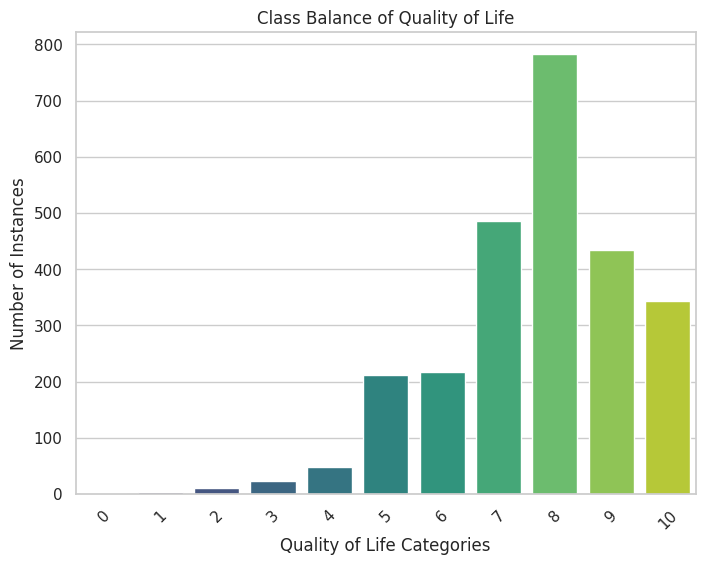

In [ ]:
plt.figure(figsize=(8, 6))
sns.barplot(x=class_counts.index, y=class_counts.values, palette='viridis')
plt.title('Class Balance of Quality of Life')
plt.xlabel('Quality of Life Categories')
plt.ylabel('Number of Instances')
plt.xticks(rotation=45)
plt.show()

**Quality of Life variable mapping**

In [ ]:
def recategorize_quality_of_life(value):
    if value in [0, 1, 2, 3]:
        return 0
    elif value in [4, 5, 6, 7]:
        return 1
    elif value in [8, 9, 10]:
        return 2
    else:
        return None

In [ ]:
df['Quality of Life Category'] = df['Quality of Life'].apply(recategorize_quality_of_life)

In [ ]:
df_numerical = df.drop(columns=['Quality of Life'])

In [ ]:
df["Quality of Life Category"].unique()

array([2, 1, 0])

In [ ]:
class_counts_new = df['Quality of Life Category'].value_counts()

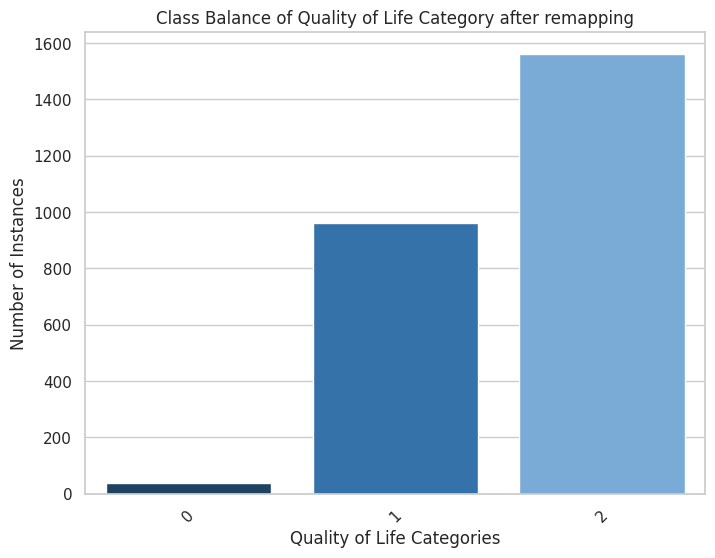

In [ ]:
# Define your custom palette with dark blue, dark green, and light green#12436D
custom_palette = sns.color_palette(["#12436D", "#2073BC", "#6BACE6"])  # Dark blue, dark green, light green
plt.figure(figsize=(8, 6))
sns.barplot(x=class_counts_new.index, y=class_counts_new.values, palette=custom_palette)
plt.title('Class Balance of Quality of Life Category after remapping')
plt.xlabel('Quality of Life Categories')
plt.ylabel('Number of Instances')
plt.xticks(rotation=45)
plt.show()

In [ ]:
print(class_counts_new)

Quality of Life Category
2    1562
1     963
0      40
Name: count, dtype: int64


In [ ]:
#########################################################################################################

## y

In [ ]:
df_backup=df.copy()

In [ ]:
# y is Quality of Life Catergory
y = df['Quality of Life Category']

## dropng ['Quality of Life Category'] from df

In [ ]:
# drop ['Quality of Life Category'] from df
df = df.drop(columns=['Quality of Life Category'])
# drop df['Quality of Life']
df = df.drop(columns=['Quality of Life'])

# Visualization


## Bivariate

### For Binary Catergorical Vs Response

In [ ]:
## I

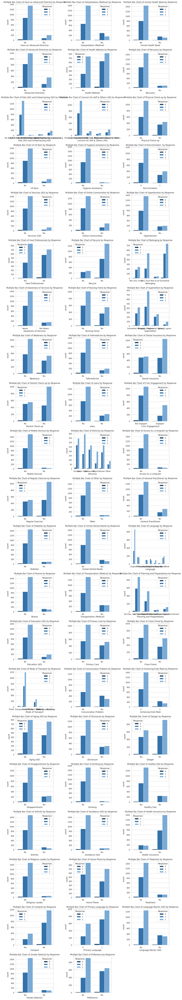

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `y` is your response variable and `data` is your DataFrame containing the variables
# Convert `y` to a DataFrame for easier plotting
y_df = pd.DataFrame({'Response': y})

# Concatenate y_df with data to create a single DataFrame for plotting
combined_data = pd.concat([y_df, data], axis=1)

# Set the number of rows and columns for the subplots
num_vars = len(Nominal_Categorical_in_both)
n_cols = 3  # Number of columns in the subplot grid
n_rows = (num_vars + n_cols - 1) // n_cols  # Calculate the required number of rows

# Create subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 4))

# Flatten the axes array for easier iteration
axes = axes.flatten()

# Loop through each variable in Nominal_Categorical_in_both
for i, var in enumerate(Nominal_Categorical_in_both):
    sns.countplot(data=combined_data, x=var, hue='Response', ax=axes[i], palette=custom_palette)
    axes[i].set_title(f'Multiple Bar Chart of {var} by Response')
    axes[i].legend(title='Response')

# Remove empty subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
# II

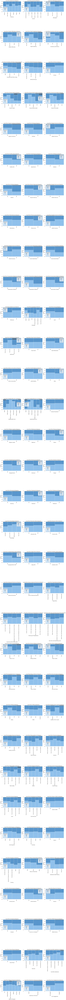

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd

# Assuming `y` is your response variable and `data` is your DataFrame containing the variables
# Convert `y` to a DataFrame for easier plotting
y_df = pd.DataFrame({'Response': y})

# Concatenate y_df with data to create a single DataFrame for plotting
combined_data = pd.concat([y_df, data], axis=1)

# Get the names of all categorical variables
cat_vars = combined_data.select_dtypes(include=['object', 'category']).columns.tolist()

# Remove the response variable 'Response' if it is in cat_vars
if 'Response' in cat_vars:
    cat_vars.remove('Response')

# Set the number of rows and columns for the subplots
num_cols = len(cat_vars)
num_rows = (num_cols + 2) // 3  # To ensure enough rows for the subplots

# Increase the figure size to make the plots clearer
fig, axs = plt.subplots(nrows=num_rows, ncols=3, figsize=(15, 7 * num_rows))

# Flatten the axes array for easier iteration
axs = axs.flatten()

# Loop through each variable in cat_vars and create density plots for the top 6 values
for i, var in enumerate(cat_vars):
    # Get the top 6 most frequent values for the variable
    top_values = combined_data[var].value_counts().nlargest(6).index
    filtered_data = combined_data[combined_data[var].isin(top_values)]

    # Create a density plot for the top 6 values of the categorical variable
    sns.histplot(
        x=var, hue='Response', data=filtered_data, ax=axs[i], multiple="fill",
        kde=False, element="bars", fill=True, stat='density', palette=custom_palette
    )

    # Set x-tick labels explicitly
    tick_positions = range(len(top_values))
    axs[i].set_xticks(tick_positions)
    axs[i].set_xticklabels(top_values, rotation=90)

    # Set the title and labels
    axs[i].set_title(f'Count Plot of {var} by Response')
    axs[i].set_xlabel(var)
    axs[i].set_ylabel('Density')

# Remove any remaining blank subplots
for j in range(num_cols, len(axs)):
    fig.delaxes(axs[j])

# Adjust spacing between subplots
fig.tight_layout()

# Show the plot
plt.show()


### For Ordinal Catergorical Vs Response

1.   List item
2.   List item



In [ ]:
y

,Quality of Life Category
0,2
1,1
2,2
3,2
4,2
...,...
2560,2
2561,2
2562,1
2563,1


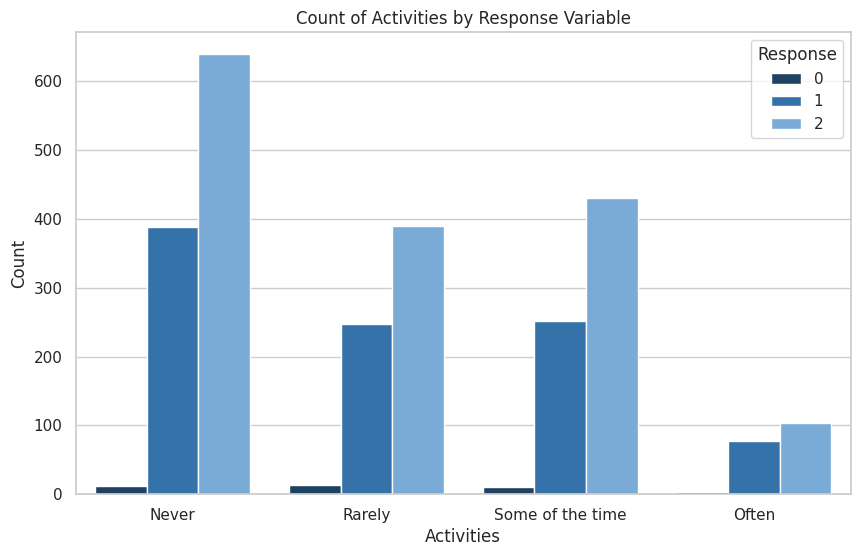

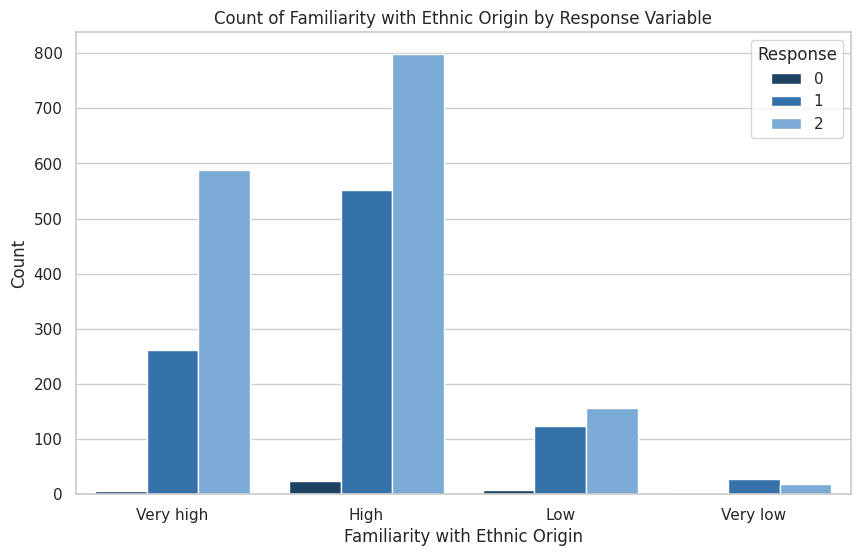

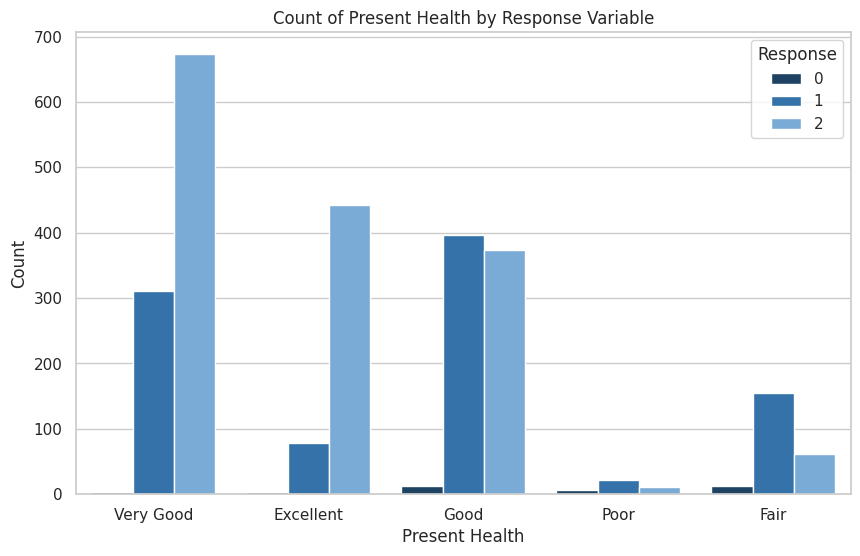

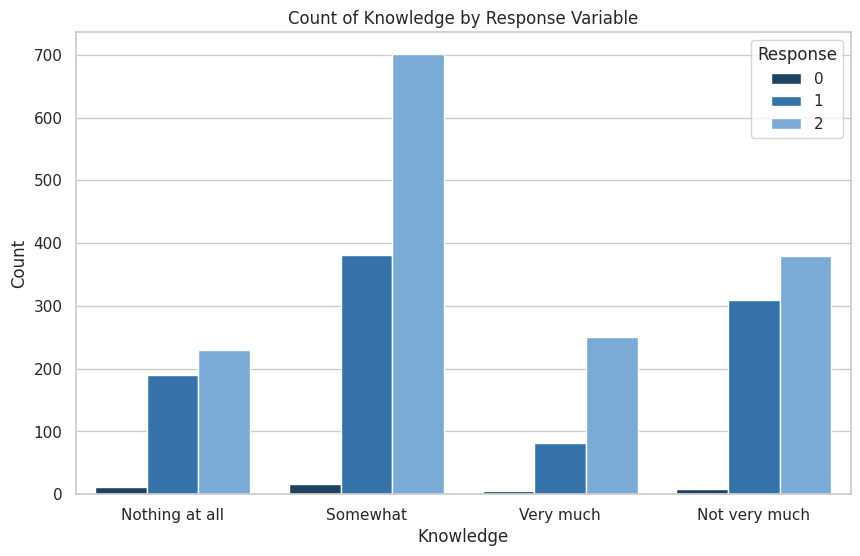

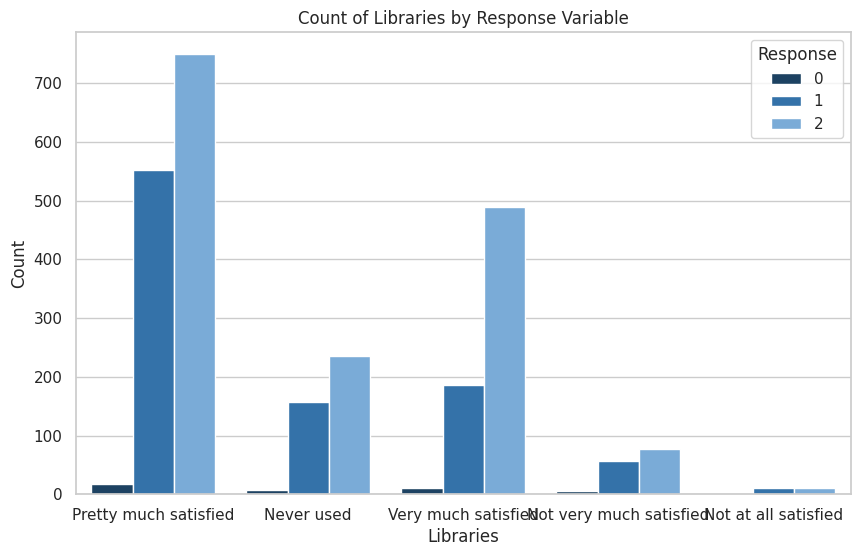

...

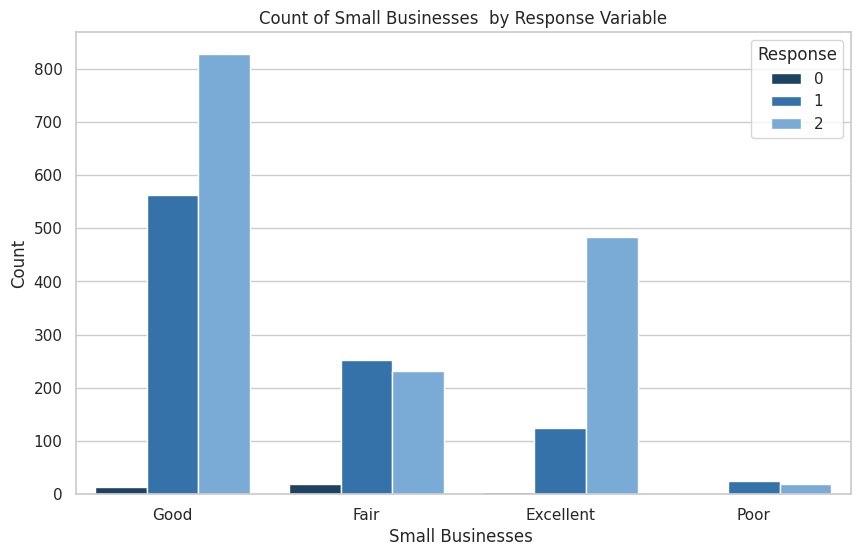

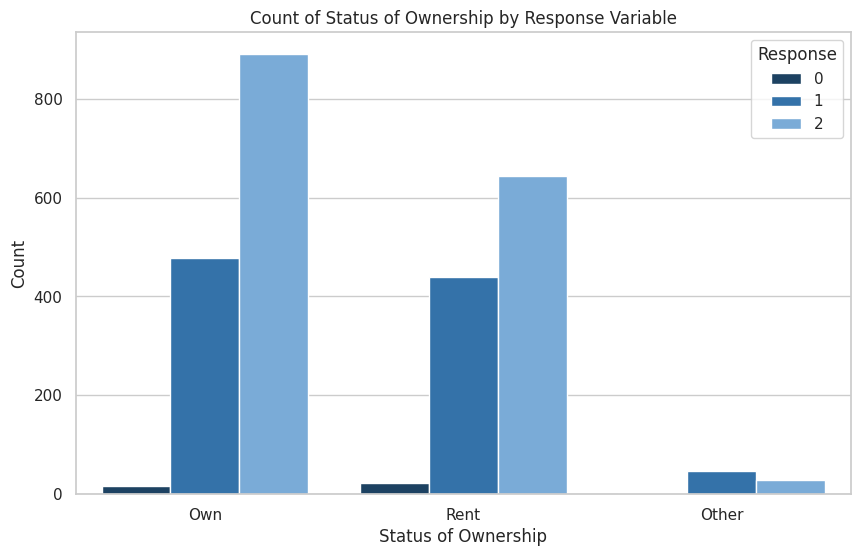

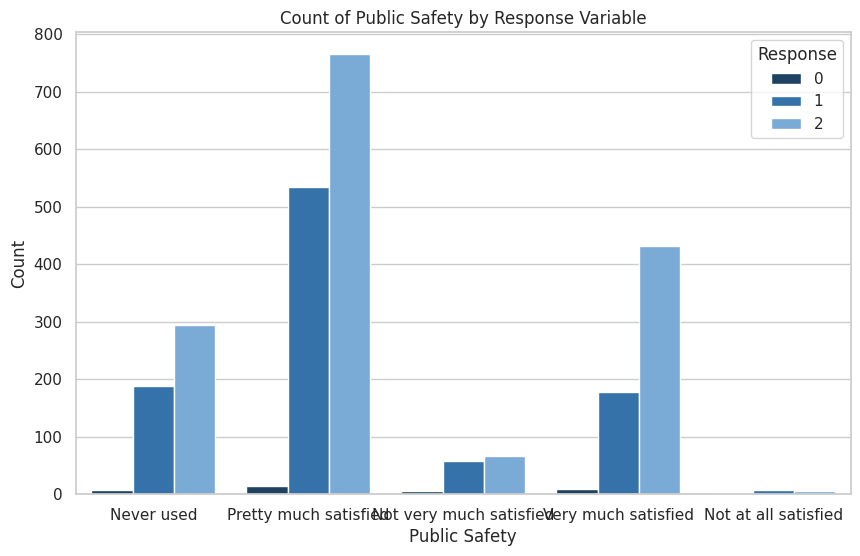

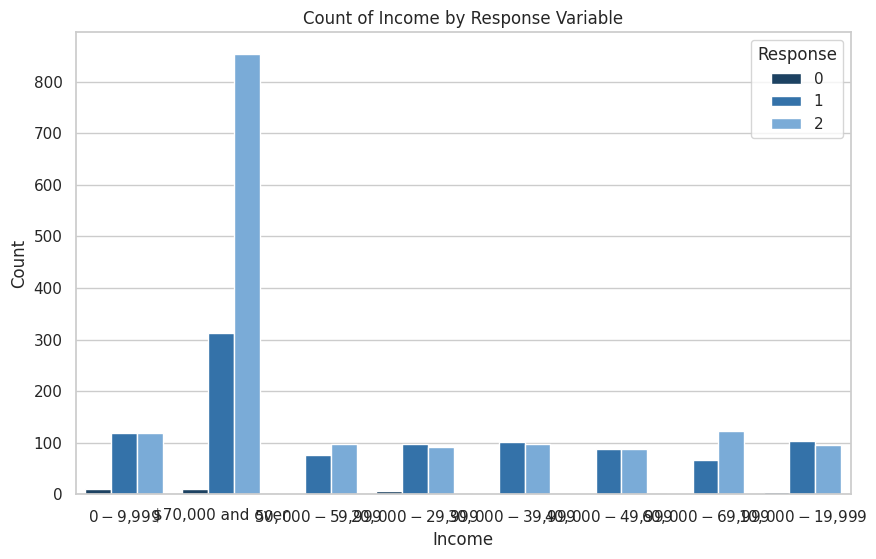

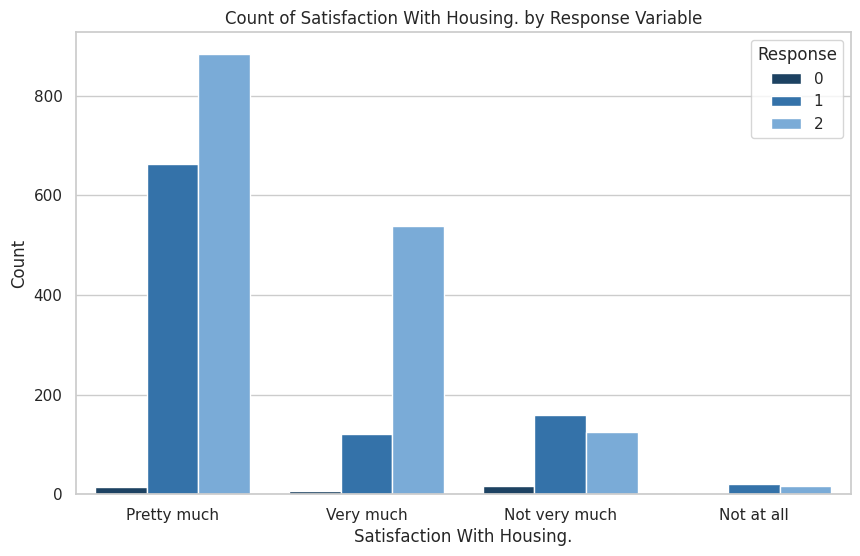

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `data` is your DataFrame and `y` is your response variable
# Convert y to a DataFrame for plotting
response_variable = pd.Series(y, name='Response')

# Combine the response variable with the original DataFrame
data_with_response = pd.concat([data, response_variable], axis=1)

# Assuming `Ordinal_Categorical` is a list of your ordinal categorical variable names
Ordinal_Categorical = Ordinal_Categorical_in_both  # Replace with your actual variable names

# Set the style for the plots
sns.set(style="whitegrid")

# Loop through each ordinal categorical variable and create a bar plot
for var in Ordinal_Categorical:
    plt.figure(figsize=(10, 6))

    # Create the bar plot
    sns.countplot(x=var, hue='Response', data=data_with_response, palette=custom_palette)

    # Set the title and labels
    plt.title(f'Count of {var} by Response Variable')
    plt.xlabel(var)
    plt.ylabel('Count')
    plt.legend(title='Response', loc='upper right')

    # Show the plot
    plt.show()


### For Numerical_Columns_in_both Vs Response




In [ ]:
Numerical_Columns_in_both

['Residency ',
 'Friends Connectivity Score',
 'Family Connectivity Score',
 'Family Relationship Score',
 'Age',
 'Family Dynamics Score',
 'Family Expression Score',
 'Family Values Score',
 'Religious Connectivity Score',
 'Community Engagement Score',
 'Duration of Residency']

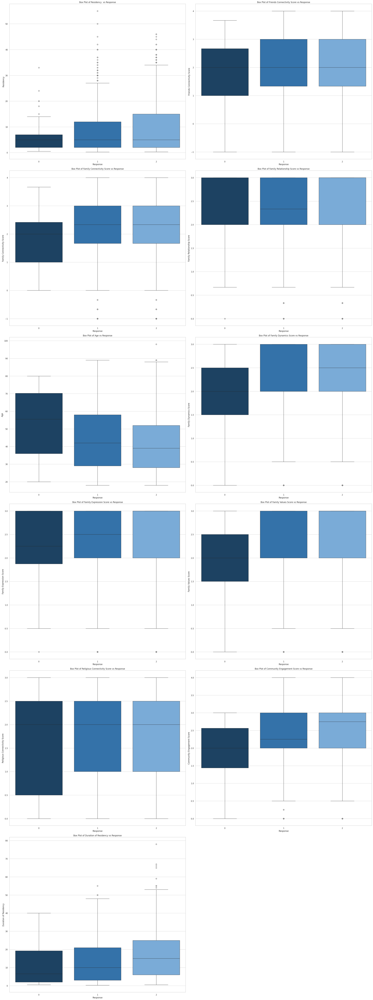

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming `data` is your DataFrame and `y` is your response variable
# Assuming `ForNumerical_Columns_in_both` is a list of numerical columns

# Add response variable to the DataFrame for plotting
data['Response'] = y

# Set up the matplotlib figure
plt.figure(figsize=(30, 80))

# Loop through each numerical column and create a box plot
for i, column in enumerate(Numerical_Columns_in_both):
    plt.subplot(6, 2, i + 1)  # Adjust the number of rows and columns as needed
    sns.boxplot(x='Response', y=column, data=data, palette=custom_palette)
    plt.title(f'Box Plot of {column} vs Response')
    plt.xlabel('Response')
    plt.ylabel(column)

# Adjust layout
plt.tight_layout()
plt.show()


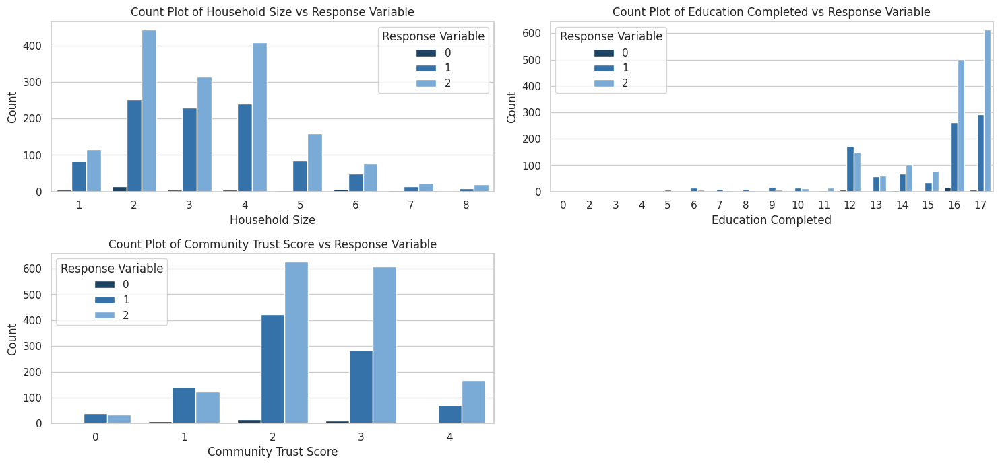

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming y is your response variable and data is your DataFrame
# And discrete_columns_in_both is a list of your discrete variables

# Set the size of the plots
plt.figure(figsize=(15, 10))

# Loop through each variable in discrete_columns_in_both
for i, column in enumerate(discrete_columns_in_both):
    plt.subplot(3, (len(discrete_columns_in_both) + 1) // 2, i + 1)  # Adjust rows and columns as needed
    sns.countplot(data=data, x=column, hue=y, palette=custom_palette)  # Use hue to differentiate between categories in y
    plt.title(f'Count Plot of {column} vs Response Variable')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.legend(title='Response Variable')

# Adjust layout to prevent overlap
plt.tight_layout()
plt.show()


In [ ]:
import pandas as pd
import scipy.stats as stats

# Assuming `y` is your response variable and `data` is your DataFrame
response_variable = y  # Use your response variable directly if it's a series

# Create a DataFrame to store the results
results = {
    'Variable': [],
    'Chi2': [],
    'p-value': []
}

# Function to check chi-square assumptions and perform the test
def check_chi_square_assumptions(var, response_variable, df):
    contingency_table = pd.crosstab(df[var], response_variable)
    chi2, p, dof, expected = stats.chi2_contingency(contingency_table)

    # Append results to the results dictionary
    results['Variable'].append(var)
    results['Chi2'].append(chi2)
    results['p-value'].append(p)

    # Print details
    print(f"Variable: {var}")
    print("Contingency Table:")
    print(contingency_table)
    print("Expected Frequency Table:")
    print(expected)
    print(f"Chi2: {chi2}, p-value: {p}\n")

    # Check for cells with expected frequency less than 5
    if (expected < 5).sum() > 0:
        print(f"Warning: Variable {var} has cells with expected frequency less than 5.\n")
    else:
        print(f"Variable {var} meets the assumption for expected frequencies.\n")

# Combine ordinal and nominal categorical variables into a single list
categorical_vars = Ordinal_Categorical_in_both + Nominal_Categorical_in_both

# Check assumptions and perform Chi-Square Test for categorical variables
print("Checking assumptions for Chi-Square Test:")
for var in categorical_vars:
    check_chi_square_assumptions(var, response_variable, data)

# Create a DataFrame with the results
results_df = pd.DataFrame(results)

# Filter significant variables (p-value < 0.05)
significant_vars = results_df[results_df['p-value'] < 0.05]

print("Significant Variables (p-value < 0.05):")
print(significant_vars)


Checking assumptions for Chi-Square Test:
Variable: Activities
Contingency Table:
Quality of Life Category   0    1    2
Activities                            
Never                     12  388  639
Often                      3   77  103
Rarely                    14  247  390
Some of the time          11  251  430
Expected Frequency Table:
[[ 16.20272904 390.08070175 632.7165692 ]
 [  2.85380117  68.70526316 111.44093567]
 [ 10.15204678 244.41052632 396.4374269 ]
 [ 10.791423   259.80350877 421.40506823]]
Chi2: 4.879980550404084, p-value: 0.5592962748636423


Variable: Familiarity with Ethnic Origin
Contingency Table:
Quality of Life Category         0    1    2
Familiarity with Ethnic Origin              
High                            24  552  798
Low                              8  123  157
Very high                        5  261  588
Very low                         3   27   19
Expected Frequency Table:
[[2.14269006e+01 5.15852632e+02 8.36720468e+02]
 [4.49122807e+00 1.08126316e+0

# Heat Map for CTS

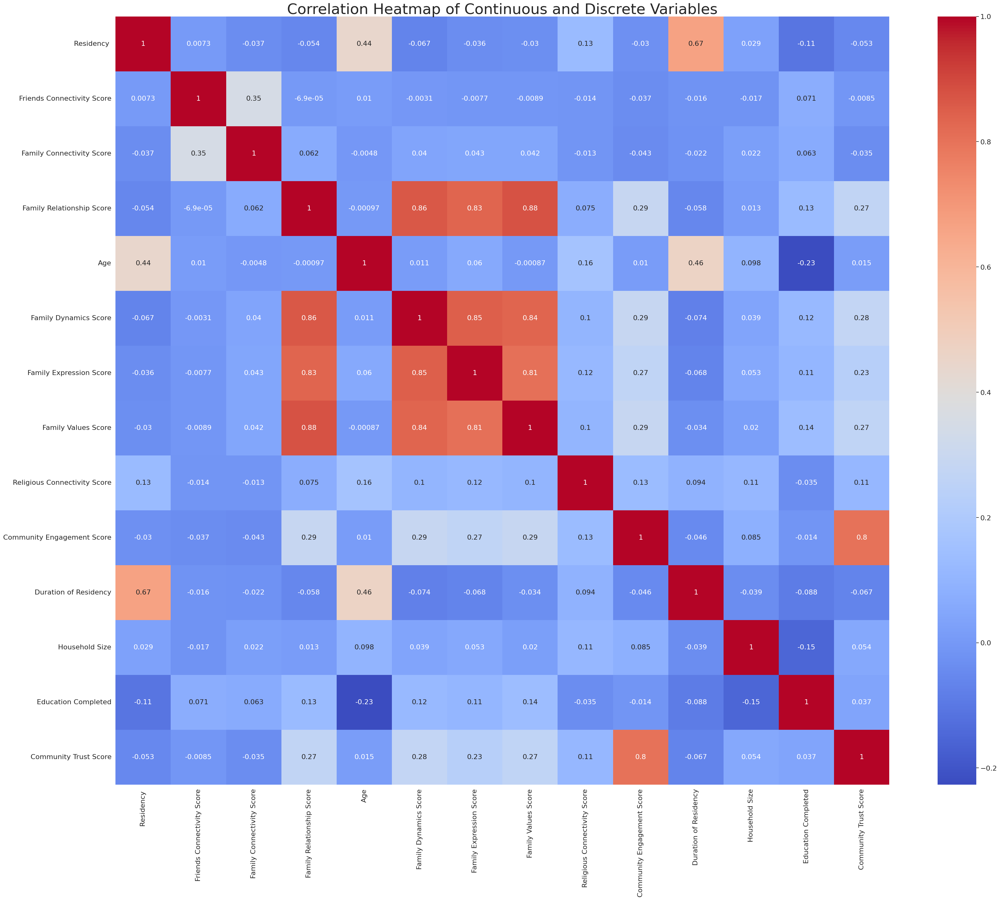

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set the context to increase font size
sns.set_context("notebook", rc={"font.size": 30, "axes.titlesize": 34, "axes.labelsize": 30,
                                  "xtick.labelsize": 16, "ytick.labelsize": 16})

# Combine the numerical and discrete variables into one list
combined_vars = Numerical_Columns_in_both + discrete_columns_in_both
# Subset the DataFrame to include only the combined variables
subset_train = df[combined_vars]

# Calculate the correlation matrix for the subset of continuous and discrete variables
correlation_matrix = subset_train.corr()

# Create the heatmap with a specified color map
plt.figure(figsize=(40, 32))
sns.heatmap(correlation_matrix, fmt='.2g', annot=True, annot_kws={"size": 16}, cmap='coolwarm')  # Change 'coolwarm' to your preferred colormap
plt.title('Correlation Heatmap of Continuous and Discrete Variables')
plt.show()


In [ ]:

# Now calculate the correlation
correlation_matrix =correlation_matrix = subset_train.corr()
correlation_matrix


,Residency,Friends Connectivity Score,Family Connectivity Score,Family Relationship Score,Age,Family Dynamics Score,Family Expression Score,Family Values Score,Religious Connectivity Score,Community Engagement Score,Duration of Residency,Household Size,Education Completed,Community Trust Score
Residency,1.000000,0.007339,-0.036962,-0.054197,0.443041,-0.066583,-0.036182,-0.030494,0.126818,-0.030025,0.667350,0.028805,-0.106970,-0.052517
Friends Connectivity Score,0.007339,1.000000,0.352261,-0.000069,0.010048,-0.003079,-0.007727,-0.008908,-0.014142,-0.036821,-0.016234,-0.016861,0.071490,-0.008523
Family Connectivity Score,-0.036962,0.352261,1.000000,0.061978,-0.004772,0.040331,0.043242,0.042480,-0.013360,-0.043476,-0.021586,0.021751,0.063360,-0.035117
Family Relationship Score,-0.054197,-0.000069,0.061978,1.000000,-0.000970,0.864855,0.833644,0.876604,0.074670,0.290345,-0.057757,0.012660,0.127670,0.267836
Age,0.443041,0.010048,-0.004772,-0.000970,1.000000,0.011058,0.060367,-0.000865,0.162127,0.010093,0.464431,0.097963,-0.226500,0.014746
Family Dynamics Score,-0.066583,-0.003079,0.040331,0.864855,0.011058,1.000000,0.850933,0.836040,0.103530,0.289083,-0.074347,0.038691,0.119791,0.275050
Family Expression Score,-0.036182,-0.007727,0.043242,0.833644,0.060367,0.850933,1.000000,0.807990,0.116533,0.266208,-0.067839,0.052579,0.107805,0.230655
Family Values Score,-0.030494,-0.008908,0.042480,0.876604,-0.000865,0.836040,0.807990,1.000000,0.103618,0.290323,-0.034269,0.019831,0.137440,0.265144
Religious Connectivity Score,0.126818,-0.014142,-0.013360,0.074670,0.162127,0.103530,0.116533,0.103618,1.000000,0.132460,0.093570,0.111154,-0.035242,0.112020
Community Engagement Score,-0.030025,-0.036821,-0.043476,0.290345,0.010093,0.289083,0.266208,0.290323,0.132460,1.000000,-0.045683,0.084790,-0.013946,0.800270


# Heatmap for Caaergorical Data

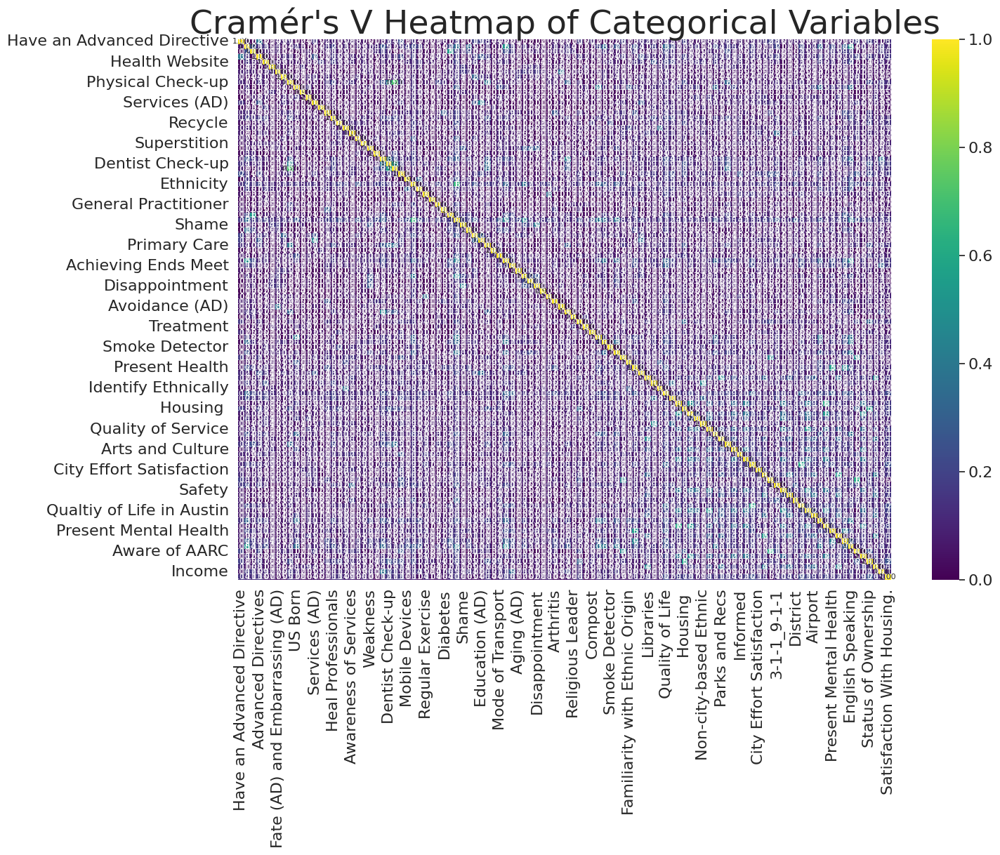

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency

# Function to calculate Cramér's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min(k-1, r-1))

# Combine Nominal and Ordinal categorical variables
categorical_vars = Nominal_Categorical_in_both + Ordinal_Categorical_in_both

# Create a Cramér's V matrix
cramers_v_matrix = pd.DataFrame(index=categorical_vars, columns=categorical_vars)

for var1 in categorical_vars:
    for var2 in categorical_vars:
        cramers_v_matrix.loc[var1, var2] = cramers_v(data[var1], data[var2])

# Convert the Cramér's V matrix to float type
cramers_v_matrix = cramers_v_matrix.astype(float)

# Create a heatmap to visualize Cramér's V matrix with annotated values and reduced font size
plt.figure(figsize=(15, 10))
sns.heatmap(cramers_v_matrix, annot=True, cmap='viridis', vmin=0, vmax=1, fmt='.2f',
            annot_kws={"size": 8})  # Adjust the size here
plt.title("Cramér's V Heatmap of Categorical Variables")
plt.show()


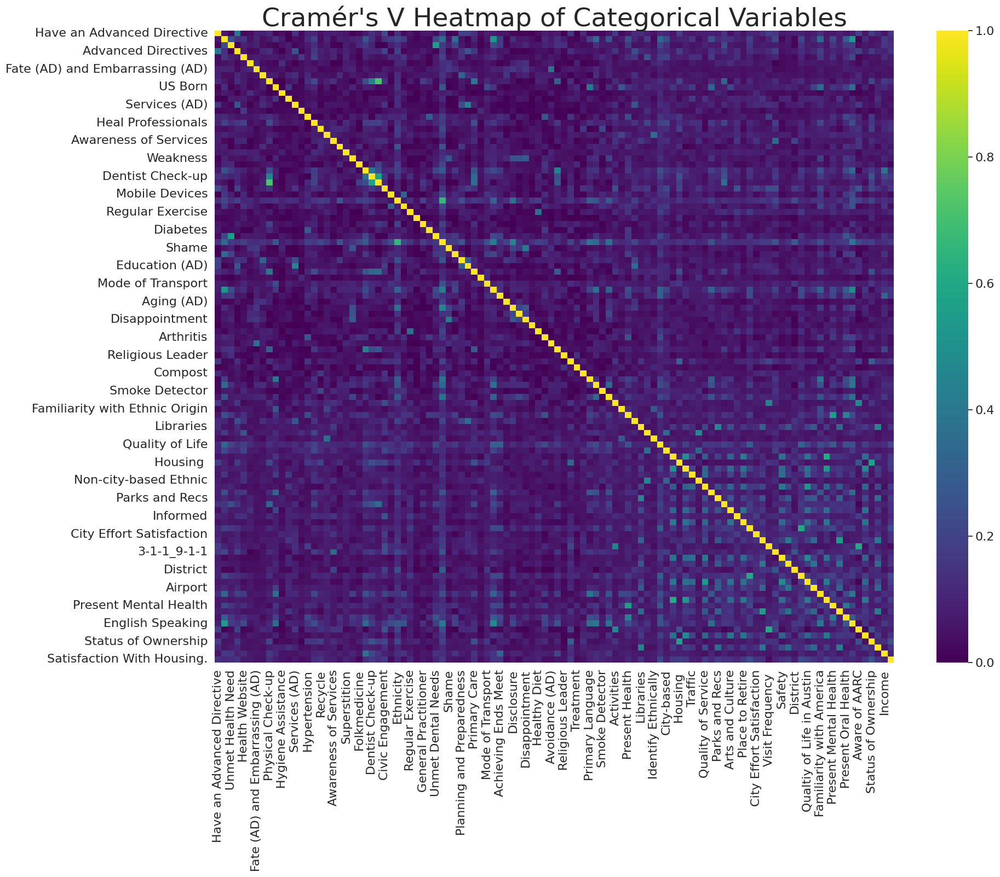

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import numpy as np

# Function to calculate Cramér's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    return np.sqrt(phi2 / min(k-1, r-1))

# Combine Nominal and Ordinal categorical variables
categorical_vars = Nominal_Categorical_in_both + Ordinal_Categorical_in_both

# Create a Cramér's V matrix
cramers_v_matrix = pd.DataFrame(index=categorical_vars, columns=categorical_vars)

for var1 in categorical_vars:
    for var2 in categorical_vars:
        cramers_v_matrix.loc[var1, var2] = cramers_v(data[var1], data[var2])

# Convert the Cramér's V matrix to float type
cramers_v_matrix = cramers_v_matrix.astype(float)

# Create a heatmap to visualize Cramér's V matrix without annotated values
plt.figure(figsize=(20, 15))  # Increased plot size for clear visualization
sns.heatmap(cramers_v_matrix, annot=False, cmap='viridis', vmin=0, vmax=1, fmt='.2f')  # No annotations
plt.title("Cramér's V Heatmap of Categorical Variables")
plt.show()


In [ ]:
import pandas as pd
from scipy.stats import spearmanr

# Combine nominal and ordinal categorical variables
categorical_vars = Nominal_Categorical_in_both + Ordinal_Categorical_in_both

# Convert categorical variables to ordinal codes using one-hot encoding
dummies = pd.get_dummies(df_backup[categorical_vars])

# Compute Spearman's rank correlation for all pairs
variables = dummies.columns
spearman_corr_matrix = pd.DataFrame(index=variables, columns=variables)

for var1 in variables:
    for var2 in variables:
        # Calculate Spearman correlation
        spearman_corr, _ = spearmanr(dummies[var1], dummies[var2])
        spearman_corr_matrix.loc[var1, var2] = spearman_corr

# Convert the correlation matrix to float type
spearman_corr_matrix = spearman_corr_matrix.astype(float)

# Display the Spearman correlation matrix
spearman_corr_matrix


,Discrimination,Achieving Ends Meet,Primary Language,Non-city-based General,Quality of Life,City-based,Non-city-based Ethnic,3-1-1_9-1-1,Have an Advanced Directive_No,Have an Advanced Directive_Yes,...,"Income_$20,000 - $29,999","Income_$30,000 - $39,999","Income_$40,000 - $49,999","Income_$50,000 - $59,999","Income_$60,000 - $69,999","Income_$70,000 and over",Satisfaction With Housing._Not at all,Satisfaction With Housing._Not very much,Satisfaction With Housing._Pretty much,Satisfaction With Housing._Very much
Discrimination,1.000000,0.040023,-0.085621,0.061421,-0.065683,0.040748,0.012801,0.022598,-0.005711,0.005711,...,0.001551,-0.001364,0.004566,0.018434,0.019512,0.013158,0.003545,0.023141,0.015256,-0.034910
Achieving Ends Meet,0.040023,1.000000,0.064007,-0.104352,-0.239005,-0.129627,-0.040767,-0.109827,0.053945,-0.053945,...,0.070448,-0.013881,-0.006275,-0.002090,-0.046953,-0.219688,0.023582,0.131744,-0.005091,-0.097341
Primary Language,-0.085621,0.064007,1.000000,-0.117299,-0.181369,-0.114120,-0.021091,-0.159697,0.013675,-0.013675,...,-0.064459,0.002165,-0.018159,-0.018159,0.005510,0.009986,-0.027923,0.017396,0.073825,-0.087121
Non-city-based General,0.061421,-0.104352,-0.117299,1.000000,0.130526,0.412072,0.602639,0.123115,-0.040078,0.040078,...,0.008532,-0.053490,-0.026768,0.024752,0.033361,0.063102,-0.023424,-0.011811,-0.007903,0.023980
Quality of Life,-0.065683,-0.239005,-0.181369,0.130526,1.000000,0.168236,0.044928,0.166678,-0.095389,0.095389,...,-0.088547,-0.089907,-0.059298,-0.034738,0.027190,0.229934,-0.036059,-0.173378,-0.152278,0.306477
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Income_$70,000 and over",0.013158,-0.219688,0.009986,0.063102,0.229934,0.091151,-0.018745,0.078966,-0.053577,0.053577,...,-0.263727,-0.268816,-0.250312,-0.250312,-0.260050,1.000000,-0.069480,-0.068198,-0.046618,0.121202
Satisfaction With Housing._Not at all,0.003545,0.023582,-0.027923,-0.023424,-0.036059,-0.041841,-0.012639,0.014994,0.034605,-0.034605,...,0.012443,-0.012672,0.029021,0.029021,0.037848,-0.069480,1.000000,-0.045136,-0.154935,-0.073585
Satisfaction With Housing._Not very much,0.023141,0.131744,0.017396,-0.011811,-0.173378,-0.084508,0.021073,-0.089589,0.050242,-0.050242,...,0.056239,0.029106,0.025726,-0.031792,-0.014604,-0.068198,-0.045136,1.000000,-0.452940,-0.215120
Satisfaction With Housing._Pretty much,0.015256,-0.005091,0.073825,-0.007903,-0.152278,-0.024621,-0.003292,-0.054197,0.083656,-0.083656,...,0.013043,0.023925,-0.011718,0.038706,-0.011071,-0.046618,-0.154935,-0.452940,1.000000,-0.738430


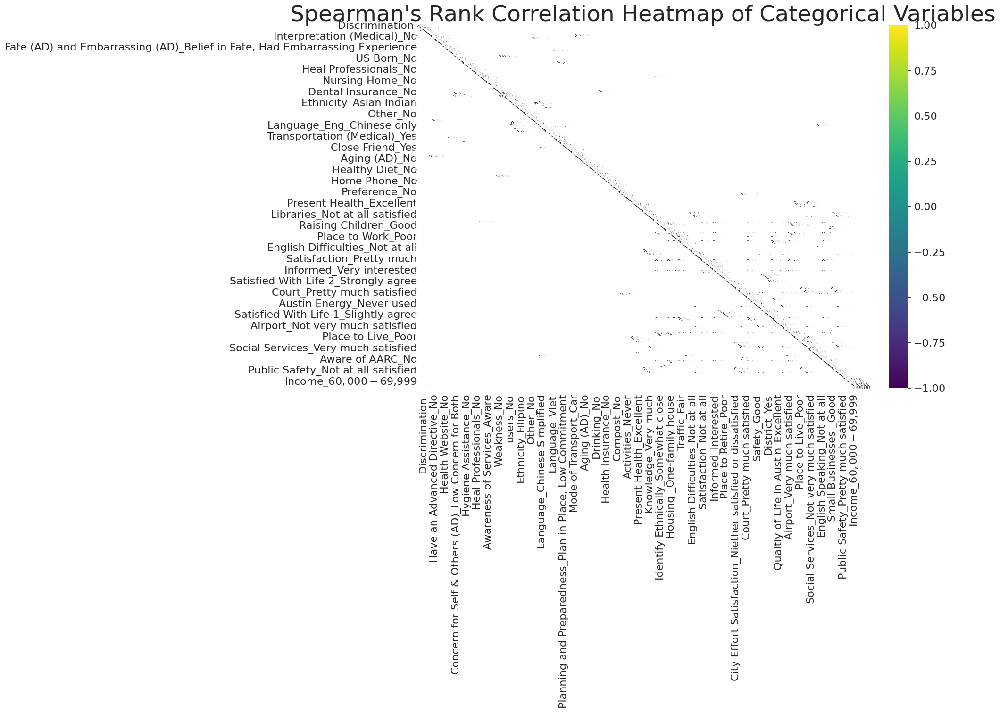

In [ ]:
# Create a heatmap to visualize Spearman's rank correlation matrix with annotated values
plt.figure(figsize=(15, 10))
sns.heatmap(spearman_corr_matrix, annot=True, cmap='viridis', vmin=-1, vmax=1, fmt='.4f', annot_kws={"size": 8})
plt.title("Spearman's Rank Correlation Heatmap of Categorical Variables")
plt.show()

# Nominal_Categorical_in_both

# Ordinal_Categorical_in_both

# Numerical_Columns_in_both

# discrete_columns_in_both

